<a href="https://colab.research.google.com/github/ABD-01/Coreset/blob/master/cifar_results/Coreset_CIFAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

There are 2 parts in this Notebook.

1.   [Finding the best samples](#Section1)
2.   [Training on those samples](#Section2)
3.   [Training on random samples](#Section3)



<a name="Section1"></a>
# Finding most valuable $n(=500)$ data samples from $50,000$ samples.

## Imports

In [ ]:
import numpy as np
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
plt.style.use("ggplot")

from functools import partial
from collections.abc import Iterable

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import SGD
from torch.utils.data import DataLoader, Subset
from torchvision.transforms import Compose, ToTensor, Normalize
from torchvision.datasets import CIFAR10
from torchvision.utils import make_grid

%pip install functorch
from functorch import make_functional_with_buffers, vmap, grad
from functorch.experimental import replace_all_batch_norm_modules_

import jax
import jax.numpy as jnp
# from jax import grad, jit, vmap
# from jax import random
# from jax.scipy.special import logsumexp
# from jax.example_libraries import stax, optimizers
# from jax.example_libraries.stax import BatchNorm, Conv, Dense, Flatten, Relu, AvgPool, LogSoftmax

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
Device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(Device)

cuda:0


## Dataset

In [ ]:
def dataset_with_indices(cls):
    """
    Modifies the given Dataset class to return a tuple data, target, index
    instead of just data, target.
    """

    def __getitem__(self, index):
        data, target = cls.__getitem__(self, index)
        return data, target, index

    return type(cls.__name__, (cls,), {
        '__getitem__': __getitem__,
    })
# https://discuss.pytorch.org/t/how-to-retrieve-the-sample-indices-of-a-mini-batch/7948/19

In [ ]:
transform = Compose([ToTensor(), Normalize((0.49139968, 0.48215827 ,0.44653124), (0.24703233, 0.24348505, 0.26158768))])
# train_data = CIFAR10("./", transform=transform, download=True)
CIFAR10WithIndices = dataset_with_indices(CIFAR10)
train_data = CIFAR10WithIndices("./", transform=transform, download=True)
train_data

Files already downloaded and verified


Dataset CIFAR10
    Number of datapoints: 50000
    Root location: ./
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.49139968, 0.48215827, 0.44653124), std=(0.24703233, 0.24348505, 0.26158768))
           )

In [ ]:
# train_images, train_labels, train_indices = next(iter(DataLoader(train_data, len(train_data), shuffle=True)))
# train_images.shape, train_labels.shape

In [ ]:
# def one_hot(x, k, dtype=jnp.float32):
#   """Create a one-hot encoding of x of size k."""
#   return jnp.array(x[:, None] == jnp.arange(k), dtype)

In [ ]:
num_classes = 10
# train_images = jnp.array(train_images).reshape(50000, 32, 32, 3) # NWHC
# train_labels = one_hot(jnp.array(train_labels), num_classes)
# print("Train Images Shape", train_images.shape)
# print("Train Labels Shape", train_labels.shape)

In [ ]:
# def iterate_minibatches(inputs, targets, batchsize):
#     assert inputs.shape[0] == targets.shape[0]
#     assert train_images.shape[0] % batchsize == 0
#     for start_idx in range(0, inputs.shape[0] - batchsize + 1, batchsize):
#         excerpt = slice(start_idx, start_idx + batchsize)
#         yield inputs[excerpt], targets[excerpt]

## Model

In [ ]:
def get_model():
    return nn.Sequential(
    nn.Conv2d(3,16,3,1,1), nn.BatchNorm2d(16), nn.ReLU(),
    nn.Conv2d(16,32,3,2,2), nn.BatchNorm2d(32), nn.ReLU(),
    nn.Conv2d(32,64,3,2,2), nn.BatchNorm2d(64), nn.ReLU(),
    # nn.Conv2d(64,128,3,2,2), nn.BatchNorm2d(128), nn.ReLU(),
    nn.AvgPool2d(8), nn.Flatten(),
    nn.Dropout(),
    nn.Linear(64, num_classes), nn.LogSoftmax(dim=-1)
    )
# init_fun, conv_net = stax.serial(Conv(16, (3, 3), (1, 1), padding=[(1,1), (1,1)]),
#                                  BatchNorm(), Relu,
#                                  Conv(32, (3, 3), (2, 2), padding=[(1,1), (1,1)]),
#                                  BatchNorm(), Relu,
#                                  Conv(64, (3, 3), (2, 2), padding=[(1,1), (1,1)]),
#                                  BatchNorm(), Relu,
#                                  Conv(128, (3, 3), (2, 2), padding=[(1,1), (1,1)]), 
#                                  BatchNorm(), Relu,
#                                  AvgPool((4,4)),
#                                  Flatten,
#                                  Dense(num_classes),
#                                  LogSoftmax)

In [ ]:
model = get_model().to(Device)
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.Linear)):
        nn.init.xavier_normal_(m.weight)
        nn.init.normal_(m.bias)
model.apply(init_weights)

Sequential(
  (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
  (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
  (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU()
  (9): AvgPool2d(kernel_size=8, stride=8, padding=0)
  (10): Flatten(start_dim=1, end_dim=-1)
  (11): Dropout(p=0.5, inplace=False)
  (12): Linear(in_features=64, out_features=10, bias=True)
  (13): LogSoftmax(dim=-1)
)

In [ ]:
conv_net, params, buffers = make_functional_with_buffers(model)
replace_all_batch_norm_modules_(conv_net)
# init_wrapper = partial(init_fun, input_shape=(10, 32, 32, 3))
# _, params = init_wrapper(random.PRNGKey(0))

FunctionalModuleWithBuffers(
  (stateless_model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (2): ReLU()
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (8): ReLU()
    (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (11): ReLU()
    (12): AvgPool2d(kernel_size=4, stride=4, padding=0)
    (13): Flatten(start_dim=1, end_dim=-1)
    (14): Linear(in_features=128, out_features=10, bias=True)
    (15): LogSoftmax(dim=-1)
  )
)

In [ ]:
def init_network_params(seed=0):
    torch.manual_seed(seed)
    model = get_model().to(Device)
    model.apply(init_weights)
    conv_net, params, buffers = make_functional_with_buffers(model)
    replace_all_batch_norm_modules_(conv_net)
    return conv_net, params, buffers
conv_net, params, buffers = init_network_params()

In [ ]:
from operator import itemgetter
p_inds = [0,1,4,5,8, 9, 12,13, 16, 17]

In [ ]:
select_inds = itemgetter(*p_inds)
sparams = select_inds(params)
len(sparams)

10

In [ ]:
for x in sparams:
    if hasattr(x, 'shape'):
        print(f"Param: {x.shape}")
    elif isinstance(x, Iterable):
        for y in x:
            print(f"Param: {y.shape}", end=" ")
        print()
    else:
        print(f"Param: {len(x)}")

Param: torch.Size([16, 3, 3, 3])
Param: torch.Size([16])
Param: torch.Size([32, 16, 3, 3])
Param: torch.Size([32])
Param: torch.Size([64, 32, 3, 3])
Param: torch.Size([64])
Param: torch.Size([128, 64, 3, 3])
Param: torch.Size([128])
Param: torch.Size([10, 128])
Param: torch.Size([10])


In [ ]:
@grad
def loss_gradient(params, x, y):
    x = x.unsqueeze(0)
    y = y.unsqueeze(0)
    preds = conv_net(params, buffers, x)
    return F.nll_loss(preds, y)

In [ ]:
batched_loss = vmap(loss_gradient, (None, 0,0), )

In [ ]:
BatchSize = 500
loader = DataLoader(train_data, BatchSize, shuffle=True, num_workers=2, pin_memory=True)
# loader = iterate_minibatches(train_images, train_labels, batchsize=BatchSize)

## Too much memory Consumption

In [ ]:
# gradients = [[None, None] for i in range(len(params))]
# for i, batch in enumerate(loader):
#     images, labels = batch
#     gradient = batched_loss(params, images, labels)
#     if gradients[0][0] is not None:
#         for j in range(len(params)):
#             gradients[j][0] = np.concatenate([gradients[j][0], np.asarray(gradient[j][0])])
#             gradients[j][1] = np.concatenate([gradients[j][1], np.asarray(gradient[j][1])])
#     else:
#         for j in range(len(params)):
#             gradients[j][0] = np.asarray(gradient[j][0])
#             gradients[j][1] = np.asarray(gradient[j][1])
#     break

In [ ]:
# net_gradients = [[None, None] for i in range(len(params))]
# for j in range(len(params)):
#     net_gradients[j][0] = jnp.mean(gradients[j][0], axis=0)
#     net_gradients[j][1] = jnp.mean(gradients[j][1], axis=0)

## Finding Net Gradient first

In [ ]:
def get_net_gradeints(params, dataset, batch_size):
    net_gradients = [None for i in range(len(params))]
    loader = DataLoader(dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
    progress_bar = tqdm(enumerate(loader), total = len(dataset)//batch_size, desc="Net Gradients", leave=False)
    for i, batch in progress_bar:
        images, labels, _ = batch
        torch.cuda.empty_cache()
        images, labels = images.to(Device), labels.to(Device)
        gradient = batched_loss(params, images, labels)
        if net_gradients[0] is not None:
            for j in range(len(params)):
                net_gradients[j] += gradient[j].sum(axis=0).cpu().detach().numpy()
        else:
            for j in range(len(params)):
                net_gradients[j] = gradient[j].sum(axis=0).cpu().detach().numpy()

    for j in range(len(params)):
        net_gradients[j] /= len(dataset)
    return net_gradients
# net_gradients = get_net_gradeints(params, train_data, batch_size=BatchSize)

Finding Cosine Similarity between gradients per sample with gradient over entire dataset

In [ ]:
def cosinesimilarity(a,b):
    return np.divide(np.dot(a, b.T).squeeze(),  (np.linalg.norm(a, axis=-1) * np.linalg.norm(b)))
# def cosinesimilarity(a,b):
#     return jnp.divide(jnp.dot(a, b.T),  (jnp.linalg.norm(a) * jnp.linalg.norm(b)))

In [ ]:
# cs = vmap(cosinesimilarity, (0, None))

In [ ]:
def get_similarities(params, dataset, batch_size, net_gradients):
    loader = DataLoader(dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
    similarities = []
    img_indices = []
    progress_bar = tqdm(enumerate(loader), total = len(dataset)//batch_size, desc="Per Sample Gradient Similarity", leave=False)
    for i, batch in progress_bar:
        imgs, label, inds = batch
        torch.cuda.empty_cache()
        imgs, label, inds = imgs.to(Device), label.to(Device), inds.numpy()
        gradient = batched_loss(params, imgs, label)
        sim=0
        for j in range(len(params)):
            sim += cosinesimilarity(gradient[j].reshape(batch_size,-1).cpu().detach().numpy(), net_gradients[j].reshape(1,-1))
        similarities.append(sim)
        img_indices.append(inds)
    return np.concatenate(similarities), np.concatenate(img_indices)
# similarities, img_indices = get_similarities(params, train_data, BatchSize, net_gradients)


In [ ]:
# similarities.shape, img_indices.shape

## Finding top n similar samples for k iterations

In [ ]:
iterations = 100
# topn = 1000
BatchSize = 2000
# good_inds = []
all_similarities, all_imginds = [], []
for k in tqdm(range(iterations), desc="Iterations"):
    conv_net, params, buffers = init_network_params(k)
    net_gradients = get_net_gradeints(params, train_data, BatchSize)
    similarities, img_indices = get_similarities(params, train_data, BatchSize, net_gradients)

    all_similarities.append(similarities)
    all_imginds.append(img_indices)
    
    # inds = np.argpartition(-np.asarray(similarities).squeeze(), topn)[:topn]
    # good_inds.append(img_indices[inds])

# good_inds = np.concatenate(good_inds)

In [ ]:
all_similarities, all_imginds = np.stack(all_similarities), np.stack(all_imginds)

In [ ]:
# np.save("all_similarities.npy", all_similarities)
# np.save("all_imginds.npy", all_imginds)

In [ ]:
!gdown --id 1cDlvJ0x73FsllSQbPBAZhrj4pkKsAYFu
!gdown --id 1Zr1EWBajr3d-rBp_lCDXF5Sg1pMyt6Ov

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1cDlvJ0x73FsllSQbPBAZhrj4pkKsAYFu
To: /content/all_similarities.npy
100% 20.0M/20.0M [00:00<00:00, 172MB/s]


In [ ]:
all_similarities = np.load("all_similarities.npy")
all_imginds = np.load("all_imginds.npy")

In [ ]:
all_similarities.shape, all_imginds.shape

((100, 50000), (100, 50000))

In [ ]:
# !cp -v all_* /content/drive/MyDrive/Coreset_Experimentations

In [ ]:
train_labels = torch.tensor(train_data.targets)

### Class Balances Indices

In [ ]:
topn=1000
good_inds = []
cls_good_inds = [[] for i in range(num_classes)]
topn_per_class = topn // num_classes
for k, (sims, inds) in tqdm(enumerate(zip(all_similarities, all_imginds))):
    # good_inds.append( inds[ np.argpartition(-sims, topn)[:topn] ] )
    shuffled_labels = train_labels[inds]
    for i in range(num_classes):
        cls_mask = np.where(shuffled_labels == i)[0]
        cls_sims = sims[cls_mask]
        cls_inds = inds[cls_mask]

        ind = np.argpartition(-cls_sims, topn_per_class)[:topn_per_class]
        good_ind = cls_inds[ind]
        # print(train_labels[good_ind])
        cls_good_inds[i].append(good_ind)

cls_good_inds = [np.concatenate(x) for x in cls_good_inds]

0it [00:00, ?it/s]

In [ ]:
best_inds = []
for cls_good_ind in cls_good_inds:
    values, counts = np.unique(cls_good_ind, return_counts=True)
    inds = np.argpartition(-counts, kth=topn_per_class)[:topn_per_class]
    best_inds.append(cls_good_ind[inds])
best_inds = np.concatenate(best_inds)
best_inds.shape

(1000,)

In [ ]:
np.save(f"class_balanced_best_inds_{topn}.npy", best_inds)

### Class Unbalanced Indices

In [ ]:
topn = 1000
good_inds = []
for k, (sims, inds) in tqdm(enumerate(zip(all_similarities, all_imginds))):
    
    ind = np.argpartition(-sims, topn)[:topn]
    good_inds.append(inds[ind])

good_inds = np.concatenate(good_inds)

0it [00:00, ?it/s]

In [ ]:
values, counts = np.unique(good_inds, return_counts=True)
# ref:https://stackoverflow.com/a/28736715/13730689
best_inds = np.argpartition(-counts, kth=topn)[:topn]
best_inds.shape

(1000,)

In [ ]:
np.save(f"best_inds_{topn}.npy", best_inds)

In [ ]:
import requests #dependency

url = "https://discord.com/api/webhooks/988060502984904734/Qn2S1EBswB6DKR-VDEnIw1MkqjDXuphSJ4QixNWG0Y5bk-2R9dAut1aqkIpos2Bodx2k" #webhook url, from here: https://i.imgur.com/f9XnAew.png

#for all params, see https://discordapp.com/developers/docs/resources/webhook#execute-webhook
data = {"content" : f"best_inds_{topn}", "username" : "Colab"}
files = {
    'file': (f"best_inds_{topn}.pt", open(f"best_inds_{topn}.pt", 'rb')),
    
}
result = requests.post(url, json = data, files=files)

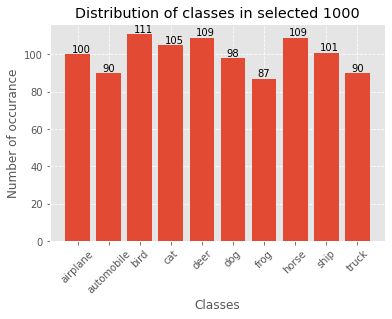

In [ ]:
plt.figure()
unique_and_counts = np.unique(train_labels[best_inds], return_counts=True)
plt.bar(*unique_and_counts)
plt.xticks(unique_and_counts[0], train_data.classes, rotation=45)
plt.xlabel("Classes")
plt.ylabel('Number of occurance')
plt.title(f"Distribution of classes in selected {topn}")
plt.grid(linestyle='--')
for i, v in enumerate(unique_and_counts[1]):
    plt.text(i-0.2, v + 1, str(v))
plt.savefig("freq.png")
plt.show()

In [ ]:
data = {"content" : f"best_inds_{topn}","username" : "Colab"}
files = {
    'file': ("freq.png", open("freq.png", 'rb')),
}
result = requests.post(url, json = data, files=files)

In [ ]:
data = {
    "content" : "DONE",
    "username" : "Colab"
}
result = requests.post(url, json = data)

<a name="Section2"></a>
# Training on Sampled Data

In [ ]:
Device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(Device)

cuda:0


## Dataset

In [ ]:
best_inds = np.load(f"best_inds_{topn}.npy")
best_inds.shape

(500,)

In [ ]:
transform = Compose([ToTensor(), Normalize((0.49139968, 0.48215827 ,0.44653124), (0.24703233, 0.24348505, 0.26158768))])
data = Subset(CIFAR10("./", transform=transform, download=True), best_inds)
test_data = CIFAR10("./", False, transform=transform, download=True)
test_data

Files already downloaded and verified
Files already downloaded and verified


Dataset CIFAR10
    Number of datapoints: 10000
    Root location: ./
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.49139968, 0.48215827, 0.44653124), std=(0.24703233, 0.24348505, 0.26158768))
           )

In [ ]:
images, labels = next(iter(DataLoader(data, len(data), shuffle=True)))
images.shape, labels.shape

(torch.Size([1000, 3, 32, 32]), torch.Size([1000]))

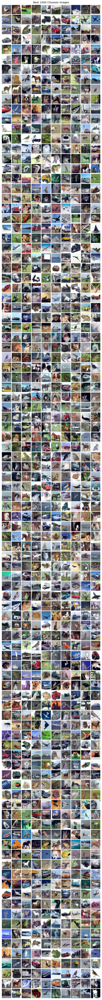

In [ ]:
img_grid = make_grid(images, 10, pad_value=1, normalize=True)
plt.figure(figsize=(10, topn//10))
plt.title(f"Best {topn} Choosen Images")
plt.imshow(img_grid.permute(1,2,0))
plt.axis('off')
plt.show()

In [ ]:
images = images.to(Device)
labels = labels.to(Device)
images.shape

torch.Size([1000, 3, 32, 32])

In [ ]:
val_size = int(0.1*labels.shape[0])
sections = (labels.shape[0]-val_size, val_size)
train_images, val_images = torch.split(images, sections)
train_labels, val_labels = torch.split(labels, sections)
print("Train Set: ", train_images.shape, train_labels.shape)
print("Val Set: ", val_images.shape, val_labels.shape)

Train Set:  torch.Size([900, 3, 32, 32]) torch.Size([900])
Val Set:  torch.Size([100, 3, 32, 32]) torch.Size([100])


In [ ]:
test_loader = DataLoader(test_data, batch_size=500, num_workers=2, pin_memory=True)

## Model

In [ ]:
model = get_model().to(Device)

In [ ]:
model.apply(init_weights)

Sequential(
  (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
  (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2))
  (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU()
  (9): AvgPool2d(kernel_size=8, stride=8, padding=0)
  (10): Flatten(start_dim=1, end_dim=-1)
  (11): Dropout(p=0.5, inplace=False)
  (12): Linear(in_features=64, out_features=10, bias=True)
  (13): LogSoftmax(dim=-1)
)

## Training Utils

In [ ]:
from torch import no_grad

In [ ]:
@torch.inference_mode()
def test(loader, model):
    model.eval()
    correct = 0
    for (images, labels) in loader:
        images, labels = images.to(Device), labels.to(Device)
        output = model(images)
        acc = output.argmax(dim=1).eq(labels).sum().item()
        correct += acc
    return correct

In [ ]:
@torch.no_grad()
def val(val_i, val_l, model, criterion):
    model.eval()
    output = model(val_i)
    loss = criterion(output, val_l)
    acc = output.argmax(dim=1).eq(val_l).float().mean().item()
    return loss, acc

In [ ]:
lr = 0.01
optimizer = SGD(model.parameters(), lr=lr, weight_decay=0.01, momentum=0.1)
criterion = nn.NLLLoss()

In [ ]:
Epochs = 1000

In [ ]:
class EarlyStopping():
    """
    Early stopping to stop the training when the loss does not improve after
    certain epochs.
    """
    def __init__(self, patience=10, min_delta=1e-4):
        """
        :param patience: how many epochs to wait before stopping when loss is
               not improving
        :param min_delta: minimum difference between new loss and old loss for
               new loss to be considered as an improvement
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_acc = None
        self.early_stop = False
    def __call__(self, val_acc):
        if  val_acc < 0.3:
            return
        if self.best_acc == None:
            self.best_acc = val_acc
        elif val_acc - self.best_acc > self.min_delta:
            self.best_acc = val_acc
            # reset counter if validation acc improves
            self.counter = 0
        elif val_acc - self.best_acc < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True
# ref : https://debuggercafe.com/using-learning-rate-scheduler-and-early-stopping-with-pytorch/

## Training Loop

In [ ]:
early_stopping = EarlyStopping()
losses, accs, val_losses, val_accs = [], [], [], []
for epoch in tqdm(range(Epochs)):
    model.train()
    optimizer.zero_grad(set_to_none=True)
    output = model(train_images)
    loss = criterion(output, train_labels)
    loss.backward()
    optimizer.step()
    losses.append(loss.item())
    acc = output.argmax(dim=1).eq(train_labels).float().mean().item()
    accs.append(acc)
    val_loss, val_acc = val(val_images, val_labels, model, criterion)
    val_losses.append(val_loss.item())
    val_accs.append(val_acc)
    early_stopping(val_acc)
    # print(f"Epoch[{epoch+1:4}] Val_Loss: {val_loss:.3f}\tVal_Acc: {val_acc:.3f}")
    if epoch % 50 == 0:
        
        correct = test(test_loader, model)
        print(f"Epoch[{epoch+1:4}] Loss: {loss.item():.2f}\tAccuracy: {acc*100 :.3f}\tVal_Loss: {val_loss:.3f}\tVal_Acc: {val_acc*100:.3f}")
        print(f"Epoch[{epoch+1:4}] Test Accuracy: {(correct / len(test_data))*100 :.3f}")
    if early_stopping.early_stop:
        print(f"Trained for {epoch+1} Epochs.")
        break

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.79	Accuracy: 10.333	Val_Loss: 2.589	Val_Acc: 11.000
Epoch[   1] Test Accuracy: 10.370
Epoch[  51] Loss: 2.30	Accuracy: 16.556	Val_Loss: 2.166	Val_Acc: 24.000
Epoch[  51] Test Accuracy: 19.830
Epoch[ 101] Loss: 2.19	Accuracy: 19.444	Val_Loss: 2.077	Val_Acc: 23.000
Epoch[ 101] Test Accuracy: 22.560
Epoch[ 151] Loss: 2.12	Accuracy: 23.111	Val_Loss: 2.040	Val_Acc: 25.000
Epoch[ 151] Test Accuracy: 24.290
Epoch[ 201] Loss: 2.11	Accuracy: 23.333	Val_Loss: 2.012	Val_Acc: 28.000
Epoch[ 201] Test Accuracy: 25.650
Epoch[ 251] Loss: 2.09	Accuracy: 23.222	Val_Loss: 1.989	Val_Acc: 29.000
Epoch[ 251] Test Accuracy: 27.020
Epoch[ 301] Loss: 2.01	Accuracy: 24.444	Val_Loss: 1.970	Val_Acc: 28.000
Epoch[ 301] Test Accuracy: 28.080
Epoch[ 351] Loss: 2.01	Accuracy: 25.556	Val_Loss: 1.961	Val_Acc: 28.000
Epoch[ 351] Test Accuracy: 28.680
Epoch[ 401] Loss: 2.00	Accuracy: 25.889	Val_Loss: 1.947	Val_Acc: 29.000
Epoch[ 401] Test Accuracy: 29.250
Epoch[ 451] Loss: 2.01	Accuracy: 24.778	Val_Lo

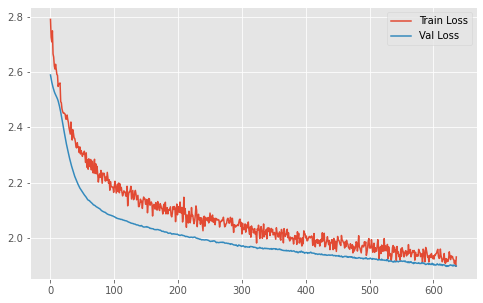

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.legend()
plt.savefig(f"LossCurve_greedy{topn}")
plt.show()

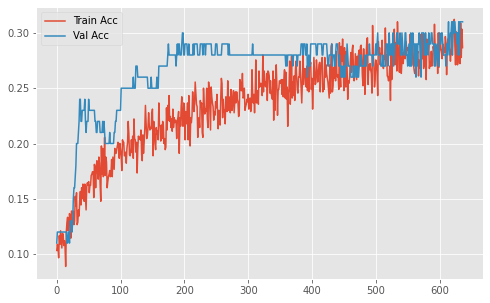

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(accs, label="Train Acc")
plt.plot(val_accs, label="Val Acc")
plt.legend()
plt.savefig(f"AccCurve_greedy{topn}")
plt.show()

In [ ]:
data = {
    "content" : f"GrredyCurves",
    "username" : "Colab"
}
files = {
    'file1': (f"LossCurve_greedy{topn}", open(f"LossCurve_greedy{topn}.png", 'rb')),
    'file2': (f"AccCurve_greedy{topn}", open(f"AccCurve_greedy{topn}.png", 'rb'))
    
}
result = requests.post(url, json = data, files=files)

In [ ]:
model.eval()
output = model(train_images)
acc = output.argmax(dim=1).eq(train_labels).float().mean().item()
print("Accuracy on Train Set", acc*100)
correct = test(test_loader, model)
print(correct, 'correctly labeled out of', len(test_data))
test_acc = correct / len(test_data) * 100
print('Accuracy on Test Set:', test_acc)

Accuracy on Train Set 37.888890504837036
3172 correctly labeled out of 10000
Accuracy on Test Set: 31.72


In [ ]:
torch.save(model.state_dict(), f"Greedy_Model_{topn}n_Epochs_{Epochs}_Early_Stop_{epoch+1}_Test_Acc_{int(test_acc)}.pth")

In [ ]:
data = {
    "content" : f"GrredyCurves",
    "username" : "Colab"
}
files = {
    'file': (f"Greedy_Model_{topn}n_Epochs_{Epochs}_Early_Stop_{epoch+1}_Test_Acc_{int(test_acc)}", open(f"Greedy_Model_{topn}n_Epochs_{Epochs}_Early_Stop_{epoch+1}_Test_Acc_{int(test_acc)}.pth", 'rb')),    
}
result = requests.post(url, json = data, files=files)

In [ ]:
# model.load_state_dict(torch.load("/content/Greedy_Model_100n_Epochs_500_Early_Stop_73_Test_Acc_14.pth"))

<All keys matched successfully>

In [ ]:
# For Per Class Accuracy
model.eval()
all_preds, all_labels = [], []
for (images, labels) in test_loader:
    images, labels = images.to(Device), labels.to(Device)
    output = model(images)
    preds = output.argmax(dim=1)
    all_preds.append(preds.cpu().detach().numpy())
    all_labels.append(labels.cpu().numpy())
all_labels = np.concatenate(all_labels)
all_preds = np.concatenate(all_preds)

In [ ]:
correct = np.equal(all_preds, all_labels).sum()
correct

3172

In [ ]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(all_labels, all_preds)
per_cls_acc = matrix.diagonal()/matrix.sum(axis=1)
for a, c in zip(per_cls_acc, train_data.classes):
    print(f"Class: {c}\tAccuracy: {a*100:.2f}")

Class: airplane	Accuracy: 40.90
Class: automobile	Accuracy: 44.50
Class: bird	Accuracy: 11.90
Class: cat	Accuracy: 30.90
Class: deer	Accuracy: 54.80
Class: dog	Accuracy: 23.60
Class: frog	Accuracy: 24.20
Class: horse	Accuracy: 16.60
Class: ship	Accuracy: 40.80
Class: truck	Accuracy: 29.00


<a name="Section3"></a>
# Training on Randomly Sampled Data

In [ ]:
Rand_Train_Acc, Rand_Val_Acc = [], []

## Dataset

In [ ]:
transform = Compose([ToTensor(), Normalize((0.49139968, 0.48215827 ,0.44653124), (0.24703233, 0.24348505, 0.26158768))])
train_data = CIFAR10("./", transform=transform, download=True)
test_data = CIFAR10("./", False, transform=transform, download=True)
test_data

Files already downloaded and verified
Files already downloaded and verified


Dataset CIFAR10
    Number of datapoints: 10000
    Root location: ./
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.49139968, 0.48215827, 0.44653124), std=(0.24703233, 0.24348505, 0.26158768))
           )

In [ ]:
train_labels = torch.tensor(train_data.targets)
train_inds = torch.arange(len(train_data))

In [ ]:
def get_cls_balanced_inds(elem_per_class):
    inds = []
    for i in range(num_classes):
        ind = np.random.choice(train_inds[torch.tensor(train_data.targets)==i], elem_per_class)
        inds.append(ind)
    inds = np.concatenate(inds)
    np.random.shuffle(inds)
    return inds

In [ ]:
inds = torch.randint(0, 50000, (topn,))
# inds = get_cls_balanced_inds(topn_per_class)
inds.shape

torch.Size([1000])

In [ ]:
data = Subset(train_data, inds)

In [ ]:
def get_dataset(cls_balanced = False):
    if cls_balanced:
        inds = get_cls_balanced_inds(topn_per_class)
    else:
        inds = torch.randint(0, 50000, (topn,))
    transform = Compose([ToTensor(), Normalize((0.49139968, 0.48215827 ,0.44653124), (0.24703233, 0.24348505, 0.26158768))])
    data = Subset(CIFAR10("./", transform=transform, download=True), inds)
    test_data = CIFAR10("./", False, transform=transform, download=True)
    return data, test_data

In [ ]:
images, labels = next(iter(DataLoader(data, len(data), shuffle=True)))
images.shape, labels.shape

(torch.Size([1000, 3, 32, 32]), torch.Size([1000]))

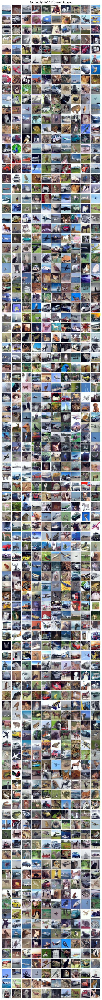

In [ ]:
img_grid = make_grid(images, 10, pad_value=1, normalize=True)
plt.figure(figsize=(10, topn//10))
plt.title(f"Randomly {topn} Choosen Images")
plt.imshow(img_grid.permute(1,2,0))
plt.axis('off')
plt.show()

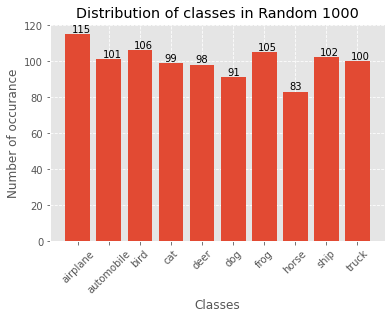

In [ ]:
plt.figure()
unique_and_counts = np.unique(labels, return_counts=True)
plt.bar(*unique_and_counts)
plt.xticks(unique_and_counts[0], train_data.classes, rotation=45)
plt.xlabel("Classes")
plt.ylabel('Number of occurance')
plt.title(f"Distribution of classes in Random {topn}")
plt.grid(linestyle='--')
for i, v in enumerate(unique_and_counts[1]):
    plt.text(i-0.2, v + 1, str(v))
plt.show()

In [ ]:
images = images.to(Device)
labels = labels.to(Device)
images.shape

torch.Size([1000, 3, 32, 32])

In [ ]:
val_size = int(0.1*labels.shape[0])
sections = (labels.shape[0]-val_size, val_size)
train_images, val_images = torch.split(images, sections)
train_labels, val_labels = torch.split(labels, sections)
print("Train Set: ", train_images.shape, train_labels.shape)
print("Val Set: ", val_images.shape, val_labels.shape)

Train Set:  torch.Size([900, 3, 32, 32]) torch.Size([900])
Val Set:  torch.Size([100, 3, 32, 32]) torch.Size([100])


In [ ]:
test_loader = DataLoader(test_data, batch_size=500, num_workers=2, pin_memory=True)

## Training Loop

  0%|          | 0/10 [00:00<?, ?it/s]

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 3.16	Accuracy: 8.778	Val_Loss: 2.903	Val_Acc: 14.000
Epoch[   1] Test Accuracy: 10.260
Epoch[  51] Loss: 2.45	Accuracy: 14.000	Val_Loss: 2.223	Val_Acc: 21.000
Epoch[  51] Test Accuracy: 15.610
Epoch[ 101] Loss: 2.24	Accuracy: 20.000	Val_Loss: 2.085	Val_Acc: 30.000
Epoch[ 101] Test Accuracy: 20.790
INFO: Early stopping counter 1 of 10
INFO: Early stopping counter 2 of 10
INFO: Early stopping counter 3 of 10
Epoch[ 151] Loss: 2.15	Accuracy: 20.111	Val_Loss: 2.027	Val_Acc: 27.000
Epoch[ 151] Test Accuracy: 23.190
INFO: Early stopping counter 4 of 10
INFO: Early stopping counter 1 of 10
INFO: Early stopping counter 2 of 10
INFO: Early stopping counter 3 of 10
INFO: Early stopping counter 4 of 10
INFO: Early stopping counter 5 of 10
INFO: Early stopping counter 6 of 10
INFO: Early stopping counter 7 of 10
INFO: Early stopping counter 8 of 10
Epoch[ 201] Loss: 2.13	Accuracy: 20.444	Val_Loss: 2.002	Val_Acc: 30.000
Epoch[ 201] Test Accuracy: 23.980
INFO: Early stopping counte

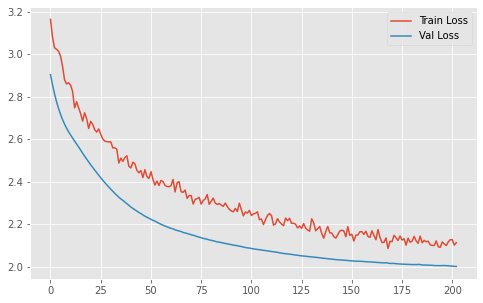

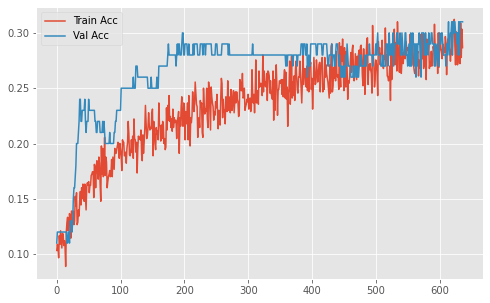

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 3.72	Accuracy: 9.444	Val_Loss: 3.179	Val_Acc: 15.000
Epoch[   1] Test Accuracy: 10.000
Epoch[  51] Loss: 2.47	Accuracy: 13.556	Val_Loss: 2.423	Val_Acc: 14.000
Epoch[  51] Test Accuracy: 11.620
Epoch[ 101] Loss: 2.28	Accuracy: 17.111	Val_Loss: 2.250	Val_Acc: 17.000
Epoch[ 101] Test Accuracy: 18.990
Epoch[ 151] Loss: 2.20	Accuracy: 17.778	Val_Loss: 2.161	Val_Acc: 19.000
Epoch[ 151] Test Accuracy: 22.070
Epoch[ 201] Loss: 2.12	Accuracy: 22.667	Val_Loss: 2.100	Val_Acc: 22.000
Epoch[ 201] Test Accuracy: 23.860
Epoch[ 251] Loss: 2.06	Accuracy: 25.444	Val_Loss: 2.062	Val_Acc: 24.000
Epoch[ 251] Test Accuracy: 25.010
Epoch[ 301] Loss: 2.04	Accuracy: 26.556	Val_Loss: 2.037	Val_Acc: 25.000
Epoch[ 301] Test Accuracy: 25.970
Epoch[ 351] Loss: 2.01	Accuracy: 27.667	Val_Loss: 2.019	Val_Acc: 25.000
Epoch[ 351] Test Accuracy: 26.590
Epoch[ 401] Loss: 2.00	Accuracy: 28.000	Val_Loss: 2.009	Val_Acc: 25.000
Epoch[ 401] Test Accuracy: 26.940
Epoch[ 451] Loss: 1.99	Accuracy: 28.111	Val_Los

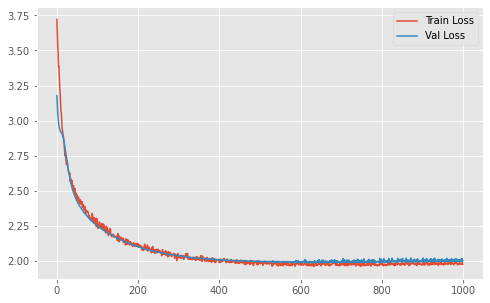

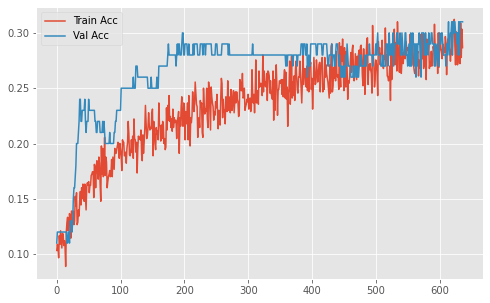

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 3.55	Accuracy: 10.333	Val_Loss: 4.071	Val_Acc: 7.000
Epoch[   1] Test Accuracy: 10.000
Epoch[  51] Loss: 2.37	Accuracy: 13.556	Val_Loss: 2.298	Val_Acc: 10.000
Epoch[  51] Test Accuracy: 12.070
Epoch[ 101] Loss: 2.21	Accuracy: 18.333	Val_Loss: 2.140	Val_Acc: 19.000
Epoch[ 101] Test Accuracy: 18.180
Epoch[ 151] Loss: 2.15	Accuracy: 18.222	Val_Loss: 2.081	Val_Acc: 22.000
Epoch[ 151] Test Accuracy: 21.100
Epoch[ 201] Loss: 2.09	Accuracy: 22.667	Val_Loss: 2.052	Val_Acc: 27.000
Epoch[ 201] Test Accuracy: 22.910
Epoch[ 251] Loss: 2.07	Accuracy: 22.667	Val_Loss: 2.030	Val_Acc: 26.000
Epoch[ 251] Test Accuracy: 24.560
Epoch[ 301] Loss: 2.04	Accuracy: 24.333	Val_Loss: 2.016	Val_Acc: 28.000
Epoch[ 301] Test Accuracy: 25.370
Epoch[ 351] Loss: 2.02	Accuracy: 25.556	Val_Loss: 2.004	Val_Acc: 27.000
Epoch[ 351] Test Accuracy: 26.050
Epoch[ 401] Loss: 2.00	Accuracy: 26.111	Val_Loss: 1.994	Val_Acc: 29.000
Epoch[ 401] Test Accuracy: 26.940
INFO: Early stopping counter 1 of 10
INFO: Earl

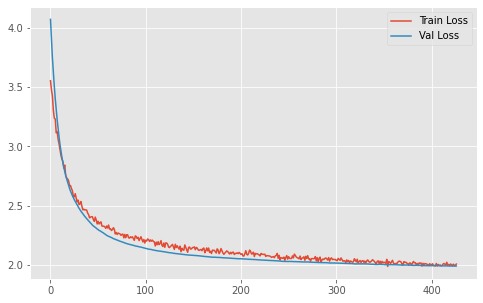

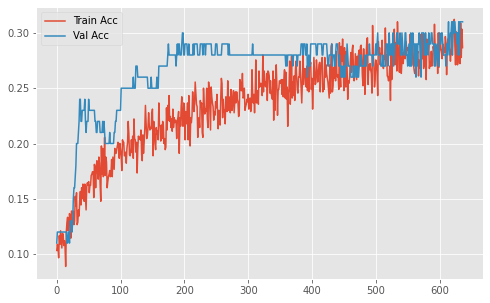

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.86	Accuracy: 10.556	Val_Loss: 3.097	Val_Acc: 10.000
Epoch[   1] Test Accuracy: 10.020
Epoch[  51] Loss: 2.38	Accuracy: 17.000	Val_Loss: 2.362	Val_Acc: 19.000
Epoch[  51] Test Accuracy: 19.140
Epoch[ 101] Loss: 2.27	Accuracy: 17.556	Val_Loss: 2.220	Val_Acc: 19.000
Epoch[ 101] Test Accuracy: 21.060
Epoch[ 151] Loss: 2.17	Accuracy: 18.444	Val_Loss: 2.154	Val_Acc: 20.000
Epoch[ 151] Test Accuracy: 22.200
Epoch[ 201] Loss: 2.12	Accuracy: 21.222	Val_Loss: 2.117	Val_Acc: 24.000
Epoch[ 201] Test Accuracy: 23.460
Epoch[ 251] Loss: 2.11	Accuracy: 21.111	Val_Loss: 2.099	Val_Acc: 26.000
Epoch[ 251] Test Accuracy: 24.270
Epoch[ 301] Loss: 2.07	Accuracy: 22.444	Val_Loss: 2.086	Val_Acc: 26.000
Epoch[ 301] Test Accuracy: 24.990
Epoch[ 351] Loss: 2.07	Accuracy: 23.222	Val_Loss: 2.079	Val_Acc: 26.000
Epoch[ 351] Test Accuracy: 25.540
Epoch[ 401] Loss: 2.06	Accuracy: 22.444	Val_Loss: 2.073	Val_Acc: 25.000
Epoch[ 401] Test Accuracy: 25.930
Epoch[ 451] Loss: 2.04	Accuracy: 23.000	Val_Lo

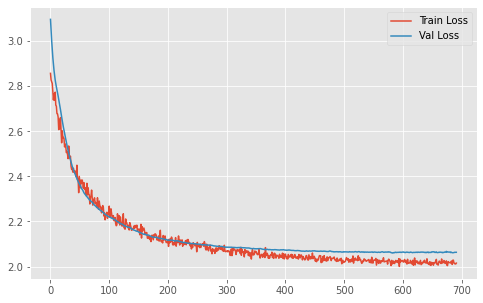

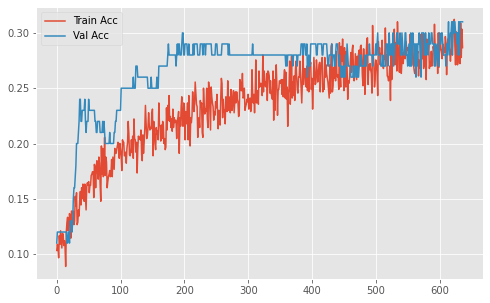

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.77	Accuracy: 9.667	Val_Loss: 2.603	Val_Acc: 14.000
Epoch[   1] Test Accuracy: 10.000
Epoch[  51] Loss: 2.30	Accuracy: 15.667	Val_Loss: 2.265	Val_Acc: 22.000
Epoch[  51] Test Accuracy: 18.330
Epoch[ 101] Loss: 2.21	Accuracy: 17.444	Val_Loss: 2.189	Val_Acc: 23.000
Epoch[ 101] Test Accuracy: 23.990
Epoch[ 151] Loss: 2.17	Accuracy: 21.000	Val_Loss: 2.159	Val_Acc: 25.000
Epoch[ 151] Test Accuracy: 26.100
Epoch[ 201] Loss: 2.13	Accuracy: 19.444	Val_Loss: 2.137	Val_Acc: 27.000
Epoch[ 201] Test Accuracy: 27.590
Epoch[ 251] Loss: 2.10	Accuracy: 21.222	Val_Loss: 2.121	Val_Acc: 26.000
Epoch[ 251] Test Accuracy: 27.910
Epoch[ 301] Loss: 2.08	Accuracy: 23.333	Val_Loss: 2.110	Val_Acc: 25.000
Epoch[ 301] Test Accuracy: 28.200
Epoch[ 351] Loss: 2.05	Accuracy: 24.333	Val_Loss: 2.100	Val_Acc: 26.000
Epoch[ 351] Test Accuracy: 28.300
Epoch[ 401] Loss: 2.06	Accuracy: 22.333	Val_Loss: 2.091	Val_Acc: 26.000
Epoch[ 401] Test Accuracy: 28.280
Epoch[ 451] Loss: 2.05	Accuracy: 23.667	Val_Los

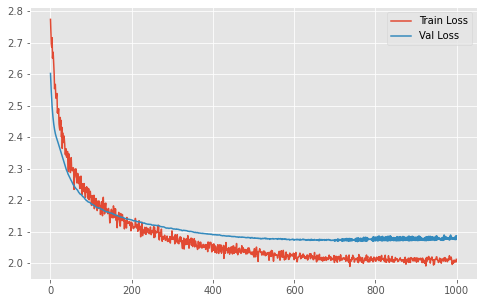

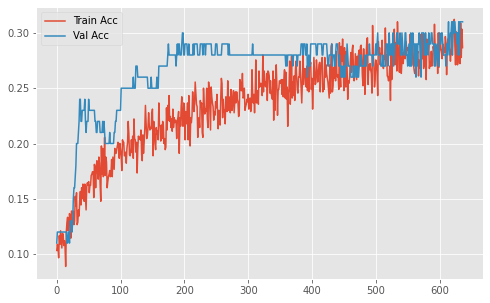

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 3.31	Accuracy: 11.000	Val_Loss: 3.323	Val_Acc: 11.000
Epoch[   1] Test Accuracy: 9.780
Epoch[  51] Loss: 2.45	Accuracy: 12.667	Val_Loss: 2.431	Val_Acc: 14.000
Epoch[  51] Test Accuracy: 14.840
Epoch[ 101] Loss: 2.23	Accuracy: 17.889	Val_Loss: 2.225	Val_Acc: 24.000
Epoch[ 101] Test Accuracy: 19.850
Epoch[ 151] Loss: 2.15	Accuracy: 19.222	Val_Loss: 2.152	Val_Acc: 29.000
Epoch[ 151] Test Accuracy: 22.410
Epoch[ 201] Loss: 2.07	Accuracy: 20.889	Val_Loss: 2.115	Val_Acc: 30.000
Epoch[ 201] Test Accuracy: 24.050
Epoch[ 251] Loss: 2.06	Accuracy: 23.667	Val_Loss: 2.090	Val_Acc: 29.000
Epoch[ 251] Test Accuracy: 25.220
Epoch[ 301] Loss: 2.02	Accuracy: 24.111	Val_Loss: 2.078	Val_Acc: 28.000
Epoch[ 301] Test Accuracy: 26.000
Epoch[ 351] Loss: 2.01	Accuracy: 25.000	Val_Loss: 2.066	Val_Acc: 29.000
Epoch[ 351] Test Accuracy: 26.590
Epoch[ 401] Loss: 2.00	Accuracy: 24.667	Val_Loss: 2.057	Val_Acc: 27.000
Epoch[ 401] Test Accuracy: 27.130
Epoch[ 451] Loss: 1.99	Accuracy: 25.667	Val_Los

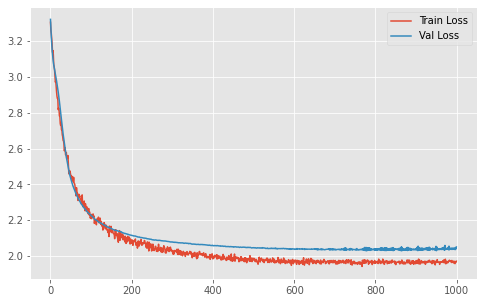

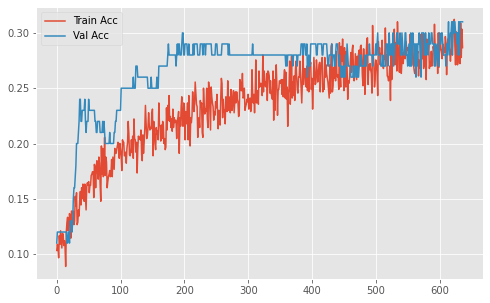

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.76	Accuracy: 8.222	Val_Loss: 2.611	Val_Acc: 9.000
Epoch[   1] Test Accuracy: 10.000
Epoch[  51] Loss: 2.33	Accuracy: 13.778	Val_Loss: 2.220	Val_Acc: 16.000
Epoch[  51] Test Accuracy: 18.250
Epoch[ 101] Loss: 2.16	Accuracy: 20.444	Val_Loss: 2.137	Val_Acc: 19.000
Epoch[ 101] Test Accuracy: 23.770
Epoch[ 151] Loss: 2.12	Accuracy: 22.444	Val_Loss: 2.099	Val_Acc: 21.000
Epoch[ 151] Test Accuracy: 25.700
Epoch[ 201] Loss: 2.10	Accuracy: 22.000	Val_Loss: 2.078	Val_Acc: 22.000
Epoch[ 201] Test Accuracy: 26.910
Epoch[ 251] Loss: 2.05	Accuracy: 23.778	Val_Loss: 2.065	Val_Acc: 24.000
Epoch[ 251] Test Accuracy: 27.480
Epoch[ 301] Loss: 2.02	Accuracy: 25.444	Val_Loss: 2.053	Val_Acc: 25.000
Epoch[ 301] Test Accuracy: 28.010
Epoch[ 351] Loss: 2.01	Accuracy: 26.444	Val_Loss: 2.046	Val_Acc: 25.000
Epoch[ 351] Test Accuracy: 28.530
Epoch[ 401] Loss: 2.00	Accuracy: 26.667	Val_Loss: 2.041	Val_Acc: 24.000
Epoch[ 401] Test Accuracy: 29.030
Epoch[ 451] Loss: 1.98	Accuracy: 28.778	Val_Loss

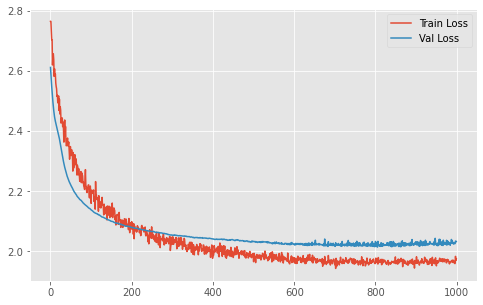

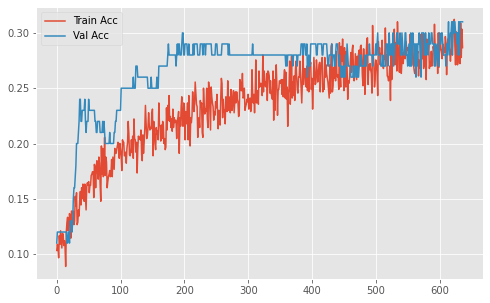

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.92	Accuracy: 8.667	Val_Loss: 2.841	Val_Acc: 12.000
Epoch[   1] Test Accuracy: 10.470
Epoch[  51] Loss: 2.32	Accuracy: 15.889	Val_Loss: 2.299	Val_Acc: 16.000
Epoch[  51] Test Accuracy: 16.740
Epoch[ 101] Loss: 2.20	Accuracy: 17.556	Val_Loss: 2.169	Val_Acc: 16.000
Epoch[ 101] Test Accuracy: 20.390
Epoch[ 151] Loss: 2.12	Accuracy: 19.556	Val_Loss: 2.117	Val_Acc: 18.000
Epoch[ 151] Test Accuracy: 23.810
Epoch[ 201] Loss: 2.04	Accuracy: 23.667	Val_Loss: 2.095	Val_Acc: 17.000
Epoch[ 201] Test Accuracy: 25.530
Epoch[ 251] Loss: 2.05	Accuracy: 24.111	Val_Loss: 2.076	Val_Acc: 19.000
Epoch[ 251] Test Accuracy: 26.700
Epoch[ 301] Loss: 2.04	Accuracy: 21.556	Val_Loss: 2.065	Val_Acc: 22.000
Epoch[ 301] Test Accuracy: 28.060
Epoch[ 351] Loss: 2.00	Accuracy: 27.556	Val_Loss: 2.059	Val_Acc: 22.000
Epoch[ 351] Test Accuracy: 28.840
Epoch[ 401] Loss: 1.99	Accuracy: 27.111	Val_Loss: 2.053	Val_Acc: 23.000
Epoch[ 401] Test Accuracy: 29.270
Epoch[ 451] Loss: 1.98	Accuracy: 28.889	Val_Los

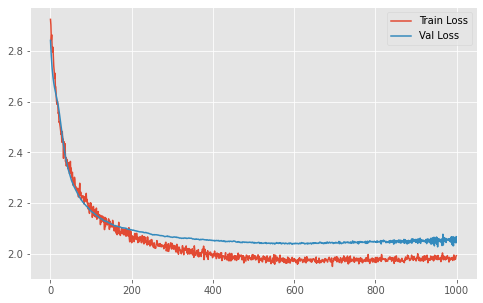

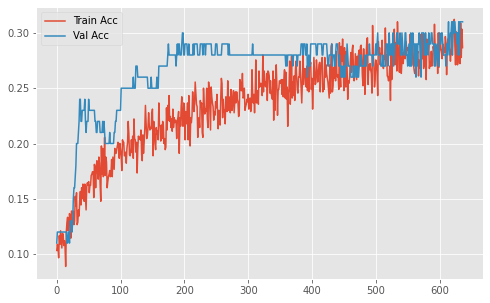

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.82	Accuracy: 10.778	Val_Loss: 2.789	Val_Acc: 13.000
Epoch[   1] Test Accuracy: 10.000
Epoch[  51] Loss: 2.34	Accuracy: 17.556	Val_Loss: 2.235	Val_Acc: 24.000
Epoch[  51] Test Accuracy: 19.020
Epoch[ 101] Loss: 2.23	Accuracy: 17.889	Val_Loss: 2.105	Val_Acc: 29.000
Epoch[ 101] Test Accuracy: 22.410
Epoch[ 151] Loss: 2.11	Accuracy: 23.889	Val_Loss: 2.051	Val_Acc: 28.000
Epoch[ 151] Test Accuracy: 23.580
Epoch[ 201] Loss: 2.10	Accuracy: 20.778	Val_Loss: 2.027	Val_Acc: 27.000
Epoch[ 201] Test Accuracy: 24.420
Epoch[ 251] Loss: 2.05	Accuracy: 24.000	Val_Loss: 2.015	Val_Acc: 25.000
Epoch[ 251] Test Accuracy: 25.020
Epoch[ 301] Loss: 2.05	Accuracy: 23.000	Val_Loss: 2.007	Val_Acc: 26.000
Epoch[ 301] Test Accuracy: 25.360
Epoch[ 351] Loss: 2.02	Accuracy: 26.778	Val_Loss: 2.004	Val_Acc: 28.000
Epoch[ 351] Test Accuracy: 26.140
Epoch[ 401] Loss: 2.00	Accuracy: 28.222	Val_Loss: 2.002	Val_Acc: 28.000
Epoch[ 401] Test Accuracy: 26.660
Epoch[ 451] Loss: 1.99	Accuracy: 27.778	Val_Lo

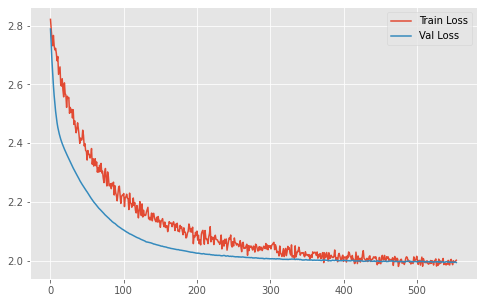

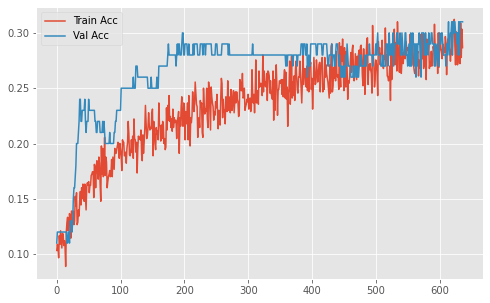

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch[   1] Loss: 2.82	Accuracy: 9.444	Val_Loss: 3.029	Val_Acc: 9.000
Epoch[   1] Test Accuracy: 10.000
Epoch[  51] Loss: 2.37	Accuracy: 15.444	Val_Loss: 2.380	Val_Acc: 16.000
Epoch[  51] Test Accuracy: 18.220
Epoch[ 101] Loss: 2.25	Accuracy: 18.111	Val_Loss: 2.196	Val_Acc: 17.000
Epoch[ 101] Test Accuracy: 20.380
Epoch[ 151] Loss: 2.18	Accuracy: 18.333	Val_Loss: 2.123	Val_Acc: 19.000
Epoch[ 151] Test Accuracy: 22.020
Epoch[ 201] Loss: 2.13	Accuracy: 21.889	Val_Loss: 2.090	Val_Acc: 22.000
Epoch[ 201] Test Accuracy: 23.380
Epoch[ 251] Loss: 2.10	Accuracy: 23.222	Val_Loss: 2.072	Val_Acc: 23.000
Epoch[ 251] Test Accuracy: 24.230
Epoch[ 301] Loss: 2.10	Accuracy: 23.667	Val_Loss: 2.063	Val_Acc: 25.000
Epoch[ 301] Test Accuracy: 25.090
Epoch[ 351] Loss: 2.08	Accuracy: 23.556	Val_Loss: 2.054	Val_Acc: 26.000
Epoch[ 351] Test Accuracy: 25.630
Epoch[ 401] Loss: 2.05	Accuracy: 27.000	Val_Loss: 2.050	Val_Acc: 27.000
Epoch[ 401] Test Accuracy: 26.010
Epoch[ 451] Loss: 2.05	Accuracy: 27.889	Val_Loss

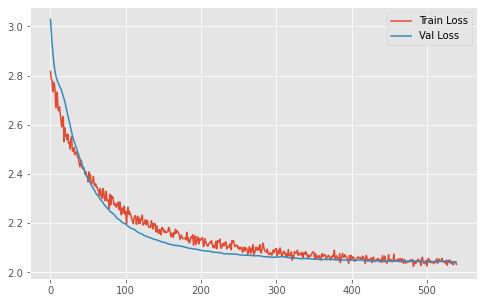

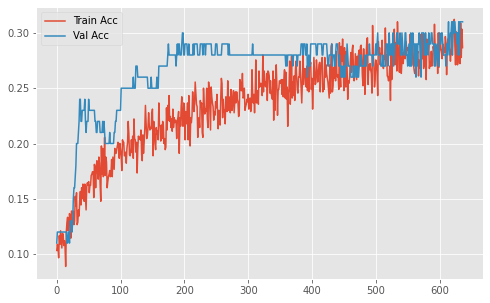

In [ ]:
for i in tqdm(range(10)):

    ### Dataset
    data, test_data = get_dataset(True)
    images, labels = next(iter(DataLoader(data, len(data), shuffle=True)))
    images = images.to(Device)
    labels = labels.to(Device)

    val_size = int(0.1*labels.shape[0])
    sections = (labels.shape[0]-val_size, val_size)
    train_images, val_images = torch.split(images, sections)
    train_labels, val_labels = torch.split(labels, sections)

    test_loader = DataLoader(test_data, batch_size=500, num_workers=2, pin_memory=True)

    ### Model
    model = get_model().to(Device)
    model.apply(init_weights)

    ### Train Utils
    lr = 0.01
    optimizer = SGD(model.parameters(), lr=lr, weight_decay=0.09, momentum=0.1)
    criterion = nn.NLLLoss()

    Epochs = 1000

    ### Train Loop
    early_stopping = EarlyStopping()
    losses2, accs2, val_losses2, val_accs2 = [], [], [], []
    for epoch in tqdm(range(Epochs)):
        model.train()
        optimizer.zero_grad(set_to_none=True)
        output = model(train_images)
        loss = criterion(output, train_labels)
        loss.backward()
        optimizer.step()
        losses2.append(loss.item())
        acc = output.argmax(dim=1).eq(train_labels).float().mean().item()
        accs2.append(acc)
        val_loss, val_acc = val(val_images, val_labels, model, criterion)
        val_losses2.append(val_loss.item())
        val_accs2.append(val_acc)
        early_stopping(val_acc)
        # print(f"Epoch[{epoch+1:4}] Val_Loss: {val_loss:.3f}\tVal_Acc: {val_acc:.3f}")
        if epoch % 50 == 0:
            
            correct = test(test_loader, model)
            print(f"Epoch[{epoch+1:4}] Loss: {loss.item():.2f}\tAccuracy: {acc*100 :.3f}\tVal_Loss: {val_loss:.3f}\tVal_Acc: {val_acc*100:.3f}")
            print(f"Epoch[{epoch+1:4}] Test Accuracy: {(correct / len(test_data))*100 :.3f}")
        if early_stopping.early_stop:
            print(f"Trained for {epoch+1} Epochs.")
            break

    plt.figure(figsize=(8,5))
    plt.plot(losses2, label="Train Loss")
    plt.plot(val_losses2, label="Val Loss")
    plt.legend()
    plt.show()

    plt.figure(figsize=(8,5))
    plt.plot(accs, label="Train Acc")
    plt.plot(val_accs, label="Val Acc")
    plt.legend()
    plt.show()

    model.eval()
    output = model(train_images)
    acc = output.argmax(dim=1).eq(train_labels).float().mean().item()
    Rand_Train_Acc.append(acc*100)
    correct = test(test_loader, model)
    Rand_Val_Acc.append((correct / len(test_data))*100)

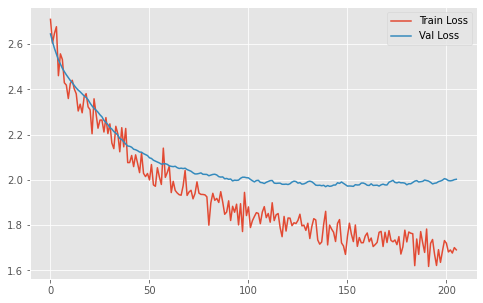

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(losses2, label="Train Loss")
plt.plot(val_losses2, label="Val Loss")
plt.legend()
plt.savefig("LossCurve_random100")
plt.show()

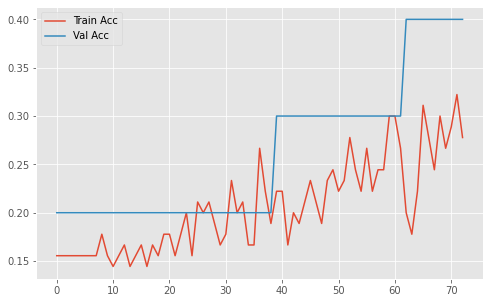

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(accs, label="Train Acc")
plt.plot(val_accs, label="Val Acc")
plt.legend()
plt.savefig("AccCurve_random100")
plt.show()

In [ ]:
model.eval()
correct = test(test_loader, model)
print(correct, 'correctly labeled out of', len(test_data))
print('Accuracy on Test Set:', correct / len(test_data) * 100)

2692 correctly labeled out of 10000
Accuracy on Test Set: 26.919999999999998


In [ ]:
print(f"Mean Train Accuracy on Random 100 Train Samples is {np.mean(Rand_Train_Acc):.4f}±{np.std(Rand_Train_Acc):.2f}%")
print(f"Mean Val   Accuracy on Random 100 Train Samples is {np.mean(Rand_Val_Acc):.4f}±{np.std(Rand_Val_Acc):.2f}%")

Mean Train Accuracy on Random 100 Train Samples is 31.8333±1.81%
Mean Val   Accuracy on Random 100 Train Samples is 27.7160±1.63%
